In [ ]:
!pip install dash-core-components
!pip install dash 

     |████████████████████████████████| 3.5MB 6.0MB/s 
  Created wheel for dash-core-components: filename=dash_core_components-1.15.0-cp37-none-any.whl size=3527014 sha256=0bf436bd0dde4fd9bed1be4079c46662fe3b1950643441e1f1c695d029690be6
  Stored in directory: /root/.cache/pip/wheels/53/3d/be/d628d6f66eedf9597f0c89c8ff43a5020ad1c25152c77d8e9f
Successfully built dash-core-components
     |████████████████████████████████| 81kB 5.2MB/s 
     |████████████████████████████████| 1.0MB 10.0MB/s 
     |████████████████████████████████| 194kB 21.1MB/s 
     |████████████████████████████████| 1.8MB 20.9MB/s 
     |████████████████████████████████| 358kB 44.0MB/s 
  Created wheel for dash: filename=dash-1.19.0-cp37-none-any.whl size=84011 sha256=106b99673c775b0144a9464775461b4614fcdc1f50fef8cfb854d54c8c647314
  Stored in directory: /root/.cache/pip/wheels/f7/50/a7/a230ff7f503b10120bff18c2524a375bb85a61ce6b519c8a77
  Created wheel for flask-compress: filename=Flask_Compress-1.9.0-cp37-none-any.whl

In [ ]:
import pandas as pd 
import matplotlib.pyplot as plt 
import scipy as sp
from scipy import pi 
from scipy import signal
from scipy.fftpack import fft
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import numpy as np
import dash_core_components as dcc
import plotly.express as px
import math
import random
%matplotlib inline
import random


In [ ]:
plt.rcParams['figure.figsize'] = (10,5)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# our shared folder is /content/drive/My Drive/Major_Project 
import os
os.chdir('/content/drive/My Drive/Major Project/FFT and signal processing/old bridge data')

In [ ]:
df = pd.read_csv('point4_most_vib.txt', skiprows = 1, sep ='\t')

In [ ]:
df

,address,Time(s),ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°)
0,0x50,13:37:38.636,-0.0005,-0.0015,1.0029,0.0055,0.0110,-0.0165,36.60
1,0x50,13:37:38.636,-0.0005,0.0020,0.9995,0.0055,0.0110,-0.0165,36.54
2,0x50,13:37:38.667,-0.0029,0.0005,1.0024,0.0055,0.0110,-0.0165,36.48
3,0x50,13:37:38.682,-0.0039,0.0020,1.0000,0.0055,0.0110,-0.0165,36.41
4,0x50,13:37:38.698,0.0000,0.0000,1.0000,0.0110,0.0110,-0.0165,36.73
...,...,...,...,...,...,...,...,...,...
29125,0x50,13:47:22.221,-0.0020,0.0078,1.0073,0.3131,-0.0494,0.0989,42.47
29126,0x50,13:47:22.283,-0.0015,0.0063,1.0049,0.3131,-0.0494,0.0989,42.41
29127,0x50,13:47:22.283,-0.0024,0.0049,1.0020,0.3131,-0.0439,0.0989,42.47
29128,0x50,13:47:22.315,-0.0005,0.0078,1.0015,0.3131,-0.0439,0.0989,42.72


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29130 entries, 0 to 29129
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   address      29130 non-null  object 
 1   Time(s)      29130 non-null  object 
 2   ax(g)        29130 non-null  float64
 3   ay(g)        29130 non-null  float64
 4   az(g)        29130 non-null  float64
 5   AngleX(deg)  29130 non-null  float64
 6   AngleY(deg)  29130 non-null  float64
 7   AngleZ(deg)  29130 non-null  float64
 8   T(°)         29130 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.0+ MB


In [ ]:
def addDate(dframe,date_string):

  dframe = date_string + dframe;

  return dframe;


**Dataframe Processing**

In [ ]:
df['Time(s)'] = addDate(df['Time(s)'], '2021-02-13')
df.index = df['Time(s)']
df.index = pd.to_datetime(df.index)
df = df.drop(columns=['address', 'Time(s)'])
df

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°)
Time(s),,,,,,,
2021-02-13 13:37:38.636,-0.0005,-0.0015,1.0029,0.0055,0.0110,-0.0165,36.60
2021-02-13 13:37:38.636,-0.0005,0.0020,0.9995,0.0055,0.0110,-0.0165,36.54
2021-02-13 13:37:38.667,-0.0029,0.0005,1.0024,0.0055,0.0110,-0.0165,36.48
2021-02-13 13:37:38.682,-0.0039,0.0020,1.0000,0.0055,0.0110,-0.0165,36.41
2021-02-13 13:37:38.698,0.0000,0.0000,1.0000,0.0110,0.0110,-0.0165,36.73
...,...,...,...,...,...,...,...
2021-02-13 13:47:22.221,-0.0020,0.0078,1.0073,0.3131,-0.0494,0.0989,42.47
2021-02-13 13:47:22.283,-0.0015,0.0063,1.0049,0.3131,-0.0494,0.0989,42.41
2021-02-13 13:47:22.283,-0.0024,0.0049,1.0020,0.3131,-0.0439,0.0989,42.47


In [ ]:
az = go.Scatter(x=df.index, y = df['az(g)'], name ="az")
ay = go.Scatter(x=df.index, y = df['ay(g)'], name="ay")
ax = go.Scatter(x=df.index, y = df['ax(g)'], name="ax")
 
figx = make_subplots(rows=1,cols=1)

#figx.add_trace(ax,row=1,col=1)
#figx.add_trace(ay,row=2,col=1)
figx.add_trace(az,row=1,col=1)


figx.show()

**Internal and external nodes**

In [ ]:
class ExNode:
    def __init__(self,size):
        self.size=size
        
class InNode:
    def __init__(self,left,right,splitAtt,splitVal):
        self.left=left
        self.right=right
        self.splitAtt=splitAtt
        self.splitVal=splitVal

Forest function

In [ ]:
def iForest(X,noOfTrees,sampleSize):
    forest=[]
    hlim=math.ceil(math.log(sampleSize,2))
    for i in range(noOfTrees):
        X_train=X.sample(sampleSize)
        forest.append(iTree(X_train,0,hlim))
    return forest

Isolation tree

In [ ]:
def iTree(X,currHeight,hlim):
    if currHeight>=hlim or len(X)<=1:
        return ExNode(len(X))
    else:
        Q=X.columns
        q=random.choice(Q)
        p=random.choice(X[q].unique())
        X_l=X[X[q]<p]
        X_r=X[X[q]>=p]
        return InNode(iTree(X_l,currHeight+1,hlim),iTree(X_r,currHeight+1,hlim),q,p)

Path length

In [ ]:
def pathLength(x,Tree,currHeight):
    if isinstance(Tree,ExNode):
        return currHeight
    a=Tree.splitAtt
    if x[a]<Tree.splitVal:
        return pathLength(x,Tree.left,currHeight+1)
    else:
        return pathLength(x,Tree.right,currHeight+1)

**Data Extraction**

In [ ]:
def extract_data(df,start_time,end_time):
  
  extracted_data = df[(df.index >= start_time) & (df.index <= end_time)]
  
  return extracted_data;

In [ ]:
def calc_rms(data,window):

  length = len(data);
  
  n_steps = np.int(np.floor(length/window));

  data_rms = np.zeros((length,1));

  for i in range(0,n_steps):
    data_rms[i] = np.sqrt(np.mean(data[(i * window):((i +1) * window)] ** 2));    

  return data_rms;

In [ ]:
az_extract = extract_data(df['az(g)'],df.index[1],df.index[len(df)-1])
len(az_extract)
# plt.plot(nl_extract)

#isolation forest experiment without using pca is as done in last section below

64048

**Stationarity and auto correlation**

In [ ]:
#@title
#rolling mean and standard deviation
rolling_mean = az_extract.rolling(20).mean()
rolling_std = az_extract.rolling(20).std()

#Plot rolling statistics
original = go.Scatter(x=az_extract.index,y=az_extract.values)
mean = go.Scatter(x=rolling_mean.index,y=rolling_mean.values, line=dict(color='chartreuse'))
std = go.Scatter(x=rolling_std.index,y=rolling_std.values, line=dict(color='black'))

figx = go.Figure(data = original)
figx.add_trace(mean)
figx.add_trace(std)
figx.show()



In [ ]:
df1 = df.resample('20ms').mean()
df1 = df1.interpolate(method='polynomial', order=2)

#df1 = df1[(df1.index >= '2021-02-09 16:25:00.000') & (df1.index <= '2021-02-09 16:30:00.000')]

from sklearn.ensemble import IsolationForest
df1

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°)
Time(s),,,,,,,
2021-02-13 16:14:15.640,-0.003233,-0.005033,1.001667,-0.049400,0.071400,-0.274700,31.176667
2021-02-13 16:14:15.660,0.007941,-0.005611,1.003133,-0.049398,0.068395,-0.274694,30.988635
2021-02-13 16:14:15.680,0.007300,-0.005350,1.001700,-0.049400,0.068650,-0.274700,30.955000
2021-02-13 16:14:15.700,-0.002900,-0.004400,0.998000,-0.049400,0.071400,-0.274700,31.050000
2021-02-13 16:14:15.720,-0.009119,-0.003665,0.995835,-0.049364,0.072047,-0.274588,31.119060
...,...,...,...,...,...,...,...
2021-02-13 16:35:38.960,-0.003400,-0.015150,1.003200,-0.563050,0.376250,1.312900,33.575000
2021-02-13 16:35:38.980,-0.005011,-0.015187,1.003834,-0.561846,0.375036,1.311862,33.557315
2021-02-13 16:35:39.000,-0.006406,-0.014100,1.003246,-0.561674,0.374173,1.311057,33.559337


In [ ]:
model = IsolationForest(contamination= 0.01)  #hyperparameter is contamination value ranges from 0 to 0.5
model.fit(df1[['az(g)']])


IsolationForest(behaviour='deprecated', bootstrap=False, contamination=0.01,
                max_features=1.0, max_samples='auto', n_estimators=100,
                n_jobs=None, random_state=None, verbose=0, warm_start=False)

In [ ]:
df1['outliers'] = pd.Series(model.predict(df1[['az(g)']]), index = df1.index).apply(lambda x: 'yes' if (x == -1) else 'no')
#pd.Series(model.predict(df1[['az(g)']]))
df1

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°),outliers
Time(s),,,,,,,,
2021-02-13 16:14:15.640,-0.003233,-0.005033,1.001667,-0.049400,0.071400,-0.274700,31.176667,no
2021-02-13 16:14:15.660,0.007941,-0.005611,1.003133,-0.049398,0.068395,-0.274694,30.988635,no
2021-02-13 16:14:15.680,0.007300,-0.005350,1.001700,-0.049400,0.068650,-0.274700,30.955000,no
2021-02-13 16:14:15.700,-0.002900,-0.004400,0.998000,-0.049400,0.071400,-0.274700,31.050000,no
2021-02-13 16:14:15.720,-0.009119,-0.003665,0.995835,-0.049364,0.072047,-0.274588,31.119060,no
...,...,...,...,...,...,...,...,...
2021-02-13 16:35:38.960,-0.003400,-0.015150,1.003200,-0.563050,0.376250,1.312900,33.575000,no
2021-02-13 16:35:38.980,-0.005011,-0.015187,1.003834,-0.561846,0.375036,1.311862,33.557315,no
2021-02-13 16:35:39.000,-0.006406,-0.014100,1.003246,-0.561674,0.374173,1.311057,33.559337,no


In [ ]:
df1.query('outliers=="yes"')

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°),outliers
Time(s),,,,,,,,
2021-02-13 16:14:25.660,-0.013282,0.000843,1.015187,-0.060105,0.092549,-0.395502,30.909132,yes
2021-02-13 16:14:37.080,0.014283,-0.004520,0.981110,-0.072464,0.097588,-0.543827,31.052207,yes
2021-02-13 16:14:39.920,-0.007317,0.003272,1.017514,-0.075547,0.117834,-0.582300,31.224488,yes
2021-02-13 16:14:39.940,-0.010700,-0.002400,1.016600,-0.076900,0.115400,-0.582300,31.240000,yes
2021-02-13 16:14:40.080,-0.013700,0.010700,1.017600,-0.071400,0.126300,-0.582300,31.240000,yes
...,...,...,...,...,...,...,...,...
2021-02-13 16:35:03.520,0.000000,-0.002000,1.016600,-0.582300,0.373500,1.708400,33.580000,yes
2021-02-13 16:35:03.660,-0.008822,0.000115,1.015355,-0.572118,0.379247,1.712284,33.719945,yes
2021-02-13 16:35:06.620,-0.022058,0.000858,1.015085,-0.556782,0.357100,1.780559,33.612415,yes


In [ ]:
fig = px.scatter(df1.reset_index(), x = df1.index, y = 'az(g)', color='outliers', hover_data=['ax(g)'])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

**Isolation forest with not knowing how much contamination present in the dataset**

In [ ]:
df2 = df.resample('20ms').mean()
df2 = df2.interpolate(method='polynomial', order=2)

#for model evaluation we set value of az(g) > 1.013 as anomalous points
df2['anomaly'] = pd.Series(df2['az(g)'].values, index = df2.index).apply(lambda x: 1 if ((x >= 1.013) or (x<=0.987)) else 0)


#splitting dataset into train set and test set
train_size = int(len(df2) * 0.8)

test_size = len(df2) - train_size

train, test = df2.iloc[0:train_size], df2.iloc[train_size:len(df2)]

# train = np.reshape(train,(train_size,1)) #Reshaping into (len,1)
# test = np.reshape(test,(test_size,1))


print(train.shape, test.shape)
df2.query('anomaly==1')
#pd.Series(df2['az(g)'].values, index = df2.index).apply(lambda x: 'yes' if (x >= 1.013) else 'no')

(51336, 8) (12835, 8)


,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°),anomaly
Time(s),,,,,,,,
2021-02-13 16:14:17.940,0.034200,0.004900,0.986800,-0.049400,0.148300,-0.307600,31.050000,1
2021-02-13 16:14:19.720,0.007800,-0.008800,0.985800,-0.060400,0.137300,-0.324100,31.050000,1
2021-02-13 16:14:19.780,-0.025639,0.006260,1.013533,-0.068207,0.152641,-0.326731,31.042818,1
2021-02-13 16:14:25.660,-0.013282,0.000843,1.015187,-0.060105,0.092549,-0.395502,30.909132,1
2021-02-13 16:14:27.000,0.002060,0.007545,1.013651,-0.062081,0.076584,-0.417514,31.075117,1
...,...,...,...,...,...,...,...,...
2021-02-13 16:35:14.180,-0.009066,-0.012384,0.981273,-0.561639,0.367629,1.851200,33.385758,1
2021-02-13 16:35:14.200,-0.008903,-0.014830,0.983117,-0.563050,0.366025,1.851200,33.349165,1
2021-02-13 16:35:23.320,-0.011845,-0.021471,0.986609,-0.565840,0.362626,1.758039,33.488493,1


In [ ]:
from sklearn.ensemble import IsolationForest
y_truth = df2['anomaly']
model = IsolationForest()
model.fit(df2[['az(g)']])

IsolationForest(behaviour='deprecated', bootstrap=False, contamination='auto',
                max_features=1.0, max_samples='auto', n_estimators=100,
                n_jobs=None, random_state=None, verbose=0, warm_start=False)

In [ ]:
score = model.decision_function(df2[['az(g)']])
anomaly = model.predict(df2[['az(g)']])

In [ ]:
score

array([0.07236447, 0.06285076, 0.07392659, ..., 0.06393558, 0.0781623 ,
       0.07266621])

(array([  146.,   142.,   149.,   242.,   133.,   194.,   252.,   224.,
          285.,   175.,   293.,   603.,   619.,   361.,   629.,   665.,
         1317.,  2058.,  1661.,  2926.,  2507.,  5301., 14554., 17327.,
        11408.]),
 array([-0.31519407, -0.29838996, -0.28158584, -0.26478172, -0.2479776 ,
        -0.23117348, -0.21436937, -0.19756525, -0.18076113, -0.16395701,
        -0.14715289, -0.13034878, -0.11354466, -0.09674054, -0.07993642,
        -0.06313231, -0.04632819, -0.02952407, -0.01271995,  0.00408417,
         0.02088828,  0.0376924 ,  0.05449652,  0.07130064,  0.08810476,
         0.10490887]),
 <a list of 25 Patch objects>)

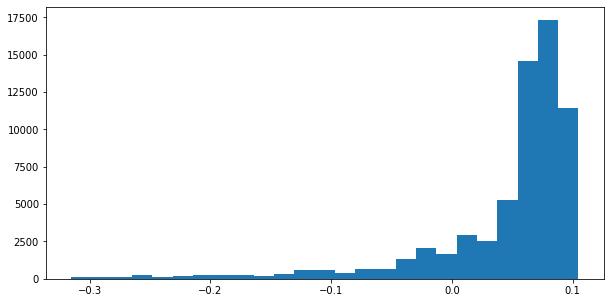

In [ ]:
plt.hist(score, bins = 25)

In [ ]:
df2['scores'] = score

In [ ]:

df2.query('scores<-0.2')

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°),anomaly,scores
Time(s),,,,,,,,,
2021-02-13 16:14:19.720,0.007800,-0.008800,0.985800,-0.060400,0.137300,-0.324100,31.050000,1,-0.218871
2021-02-13 16:14:19.780,-0.025639,0.006260,1.013533,-0.068207,0.152641,-0.326731,31.042818,1,-0.218640
2021-02-13 16:14:25.660,-0.013282,0.000843,1.015187,-0.060105,0.092549,-0.395502,30.909132,1,-0.258609
2021-02-13 16:14:27.000,0.002060,0.007545,1.013651,-0.062081,0.076584,-0.417514,31.075117,1,-0.220100
2021-02-13 16:14:32.380,0.000763,-0.010554,1.013997,-0.066512,0.100887,-0.466870,31.075052,1,-0.230898
...,...,...,...,...,...,...,...,...,...
2021-02-13 16:35:08.660,0.001429,-0.021555,0.984247,-0.555039,0.358501,1.823669,33.744089,1,-0.238018
2021-02-13 16:35:14.160,-0.008699,-0.012174,0.984301,-0.560722,0.366454,1.851200,33.439370,1,-0.238018
2021-02-13 16:35:14.180,-0.009066,-0.012384,0.981273,-0.561639,0.367629,1.851200,33.385758,1,-0.260833


In [ ]:

#outlier =-1 for middle vibration and outlier = 1 for high vibration
#df2['outliers'] = pd.Series(df2['scores'].values, index = df2.index).apply(lambda x: 2 if (x <= -0.2) else 1 if (x > -0.2) and (x<-0.1) else 0)
df2['outliers'] = pd.Series(df2['scores'].values, index = df2.index).apply(lambda x: 1 if (x <= -0.2) else 0)
y_pred_class = df2['outliers']
#prediction
#train['anomaly'] = model.predict(train[['az(g)']])
df2.query('outliers==1')

,ax(g),ay(g),az(g),AngleX(deg),AngleY(deg),AngleZ(deg),T(°),anomaly,scores,outliers
Time(s),,,,,,,,,,
2021-02-13 16:14:19.720,0.007800,-0.008800,0.985800,-0.060400,0.137300,-0.324100,31.050000,1,-0.218871,1
2021-02-13 16:14:19.780,-0.025639,0.006260,1.013533,-0.068207,0.152641,-0.326731,31.042818,1,-0.218640,1
2021-02-13 16:14:25.660,-0.013282,0.000843,1.015187,-0.060105,0.092549,-0.395502,30.909132,1,-0.258609,1
2021-02-13 16:14:27.000,0.002060,0.007545,1.013651,-0.062081,0.076584,-0.417514,31.075117,1,-0.220100,1
2021-02-13 16:14:32.380,0.000763,-0.010554,1.013997,-0.066512,0.100887,-0.466870,31.075052,1,-0.230898,1
...,...,...,...,...,...,...,...,...,...,...
2021-02-13 16:35:08.660,0.001429,-0.021555,0.984247,-0.555039,0.358501,1.823669,33.744089,1,-0.238018,1
2021-02-13 16:35:14.160,-0.008699,-0.012174,0.984301,-0.560722,0.366454,1.851200,33.439370,1,-0.238018,1
2021-02-13 16:35:14.180,-0.009066,-0.012384,0.981273,-0.561639,0.367629,1.851200,33.385758,1,-0.260833,1


In [ ]:
fig = px.scatter(df2.reset_index(), x = df2.index, y = 'az(g)', color='outliers', hover_data=['ax(g)'])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

Overall model evaluation

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix,f1_score

roc_auc_score(y_truth, y_pred_class)


0.982151383897041

In [ ]:
f1_score(y_truth, y_pred_class)


0.963373083475298

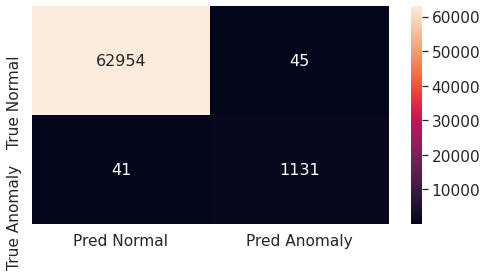

In [ ]:
#confusion matrix
if_cm=confusion_matrix(y_truth, y_pred_class)
if_cm

#plotting confusion matrix
import seaborn as sn
     
df_cm = pd.DataFrame(if_cm,
                  ['True Normal','True Anomaly'],['Pred Normal','Pred Anomaly'])
plt.figure(figsize = (8,4))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, annot=True,annot_kws={"size": 16},fmt='g')# font size